# Création des graphes - Contacts in a workplace in 2013
Importation des librairies

In [48]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt

Importation des datasets

In [49]:
contacts_dataframe = pd.read_csv('datasets/cleaned/contacts_2013.csv')
departments_dataframe = pd.read_csv('datasets/cleaned/departments_2013.csv')

Graphe des communautés de Louvain

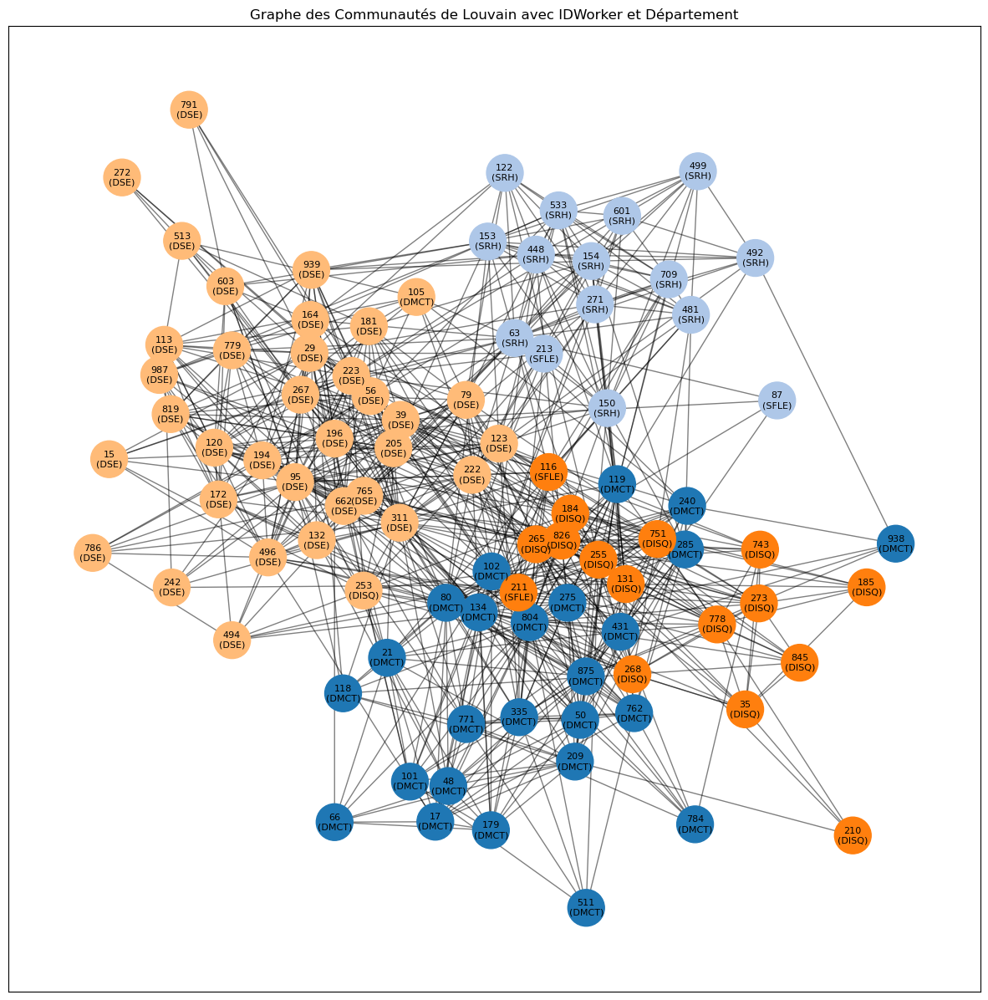

Nombre total de communautés détectées: 4

Communautés détectées avec subdivision par département:

Communauté 1:
  Département DMCT: [66, 771, 134, 335, 784, 17, 80, 275, 209, 21, 285, 804, 101, 102, 938, 875, 431, 48, 240, 50, 179, 118, 119, 762, 511]

Communauté 2:
  Département SRH: [448, 481, 153, 709, 154, 492, 271, 499, 533, 150, 601, 122, 63]
  Département SFLE: [213, 87]

Communauté 3:
  Département DISQ: [131, 265, 778, 268, 845, 273, 210, 35, 743, 751, 184, 185, 826, 255]
  Département SFLE: [211, 116]

Communauté 4:
  Département DSE: [513, 132, 779, 267, 15, 272, 786, 662, 791, 29, 164, 39, 939, 172, 819, 181, 311, 56, 194, 196, 205, 79, 987, 603, 222, 95, 223, 494, 496, 113, 242, 120, 123, 765]
  Département DMCT: [105]
  Département DISQ: [253]


In [50]:
# Création du graphe à partir des données
G = nx.from_pandas_edgelist(contacts_dataframe, 'IDWorker1', 'IDWorker2', create_using=nx.Graph())

# Associer les départements aux nœuds
department_mapping = dict(zip(departments_dataframe['IDWorker'], departments_dataframe['Department']))
nx.set_node_attributes(G, department_mapping, 'department')

# Appliquer l'algorithme de Louvain pour détecter les communautés
communities = nx.algorithms.community.louvain_communities(G)

# Création d'une mapping de couleur pour chaque communauté
colors = [plt.cm.tab20(i) for i in range(len(communities))]
community_color = {}
for i, community in enumerate(communities):
    for node in community:
        community_color[node] = colors[i]

# Récupérer les couleurs des nœuds pour la visualisation
node_colors = [community_color[node] if node in community_color else (1, 1, 1) for node in G.nodes]

# Créer des étiquettes pour les nœuds
node_labels = {node: f'{node}\n({G.nodes[node]["department"]})' for node in G.nodes}

# Dessiner le graphe
plt.figure(figsize=(15, 15))
pos = nx.spring_layout(G, seed=42)
nx.draw_networkx_edges(G, pos, alpha=0.5)
nx.draw_networkx_nodes(G, pos, node_color=node_colors, node_size=1000)
nx.draw_networkx_labels(G, pos, labels=node_labels, font_size=8)
plt.title('Graphe des Communautés de Louvain avec IDWorker et Département')
plt.show()

# Imprimer chaque communauté et le nombre total de communautés
print("Nombre total de communautés détectées:", len(communities))
print("\nCommunautés détectées avec subdivision par département:")

for i, community in enumerate(communities):
    # Grouper les nœuds par département au sein de la communauté
    departments_in_community = {}
    for node in community:
        department = G.nodes[node]['department'] if node in department_mapping else 'Non Spécifié'
        if department in departments_in_community:
            departments_in_community[department].append(node)
        else:
            departments_in_community[department] = [node]

    # Affichage de la communauté et des départements
    print(f"\nCommunauté {i+1}:")
    for department, nodes in departments_in_community.items():
        print(f"  Département {department}: {nodes}")


Graphe non-orienté des employés par département

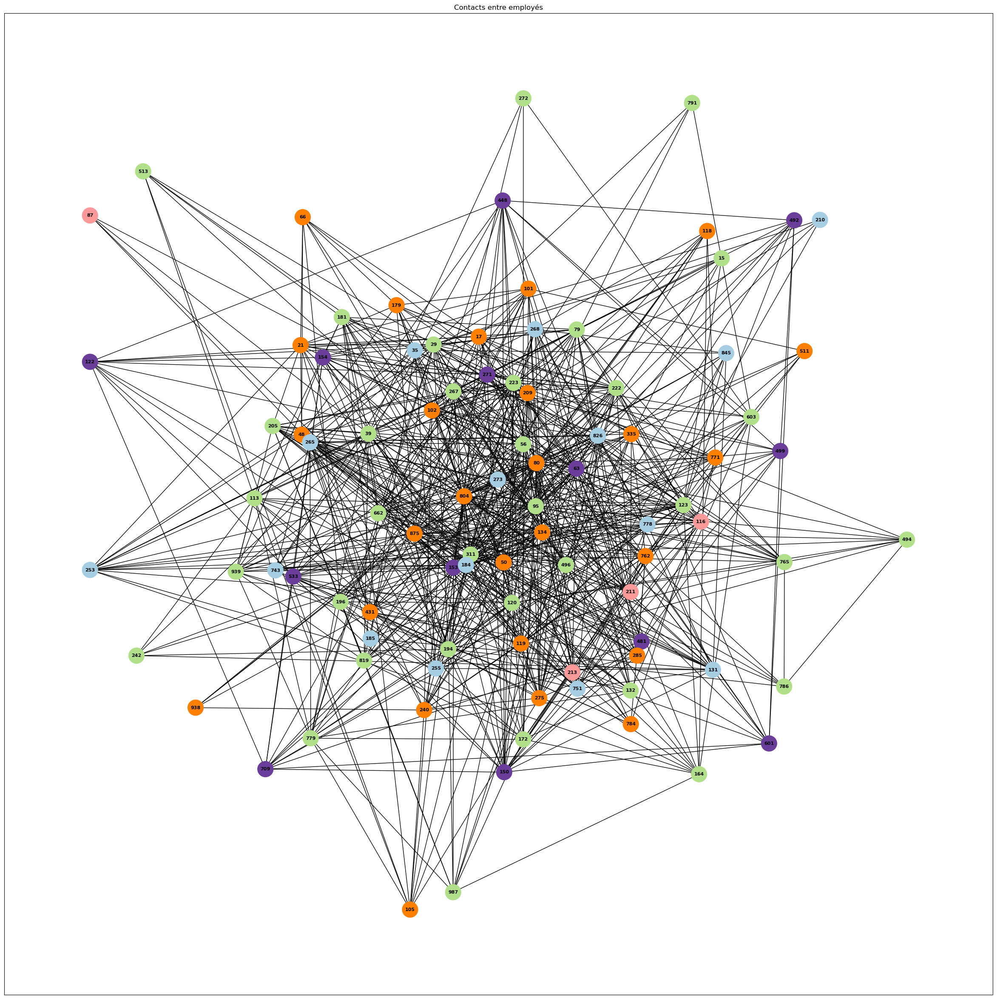

In [51]:
# Créer un graphe dirigé à partir du premier dataset
G = nx.from_pandas_edgelist(contacts_dataframe, 'IDWorker1', 'IDWorker2', ['Duration'], create_using=nx.Graph())

# Ajouter les départements comme attributs aux nœuds
department_mapping = dict(zip(departments_dataframe['IDWorker'], departments_dataframe['Department']))
for node in G.nodes:
    if node in department_mapping:
        G.nodes[node]['Department'] = department_mapping[node]

# Définir une couleur par défaut pour les nœuds sans attribut 'Department'
default_color = 'gray'

# Récupérer les couleurs des nœuds
node_colors = [G.nodes[node].get('Department', default_color) for node in G.nodes]

# Créer une palette de couleurs pour chaque département
unique_departments = departments_dataframe['Department'].unique()
colors = [plt.cm.Paired(i / len(unique_departments)) for i in range(len(unique_departments))]
department_color_mapping = dict(zip(unique_departments, colors))

# Positionner les nœuds par département
pos = {}
for department in unique_departments:
    nodes_in_department = [node for node, attrs in G.nodes(data=True) if 'Department' in attrs and attrs['Department'] == department]
    pos.update(nx.spring_layout(G.subgraph(nodes_in_department), seed=42))

# Dessiner le graphe avec des couleurs par département et regrouper physiquement les nœuds
fig, ax = plt.subplots(figsize=(30, 30))
nx.draw_networkx_nodes(G, pos, node_color=[department_color_mapping.get(color, default_color) for color in node_colors], node_size=700)
nx.draw_networkx_labels(G, pos, font_size=8, font_color='black', font_weight='bold')
nx.draw_networkx_edges(G, pos)

# Afficher le graphe sans les noms sur les arêtes
plt.title("Contacts entre employés")
plt.show()

Graphe non-orienté des départements

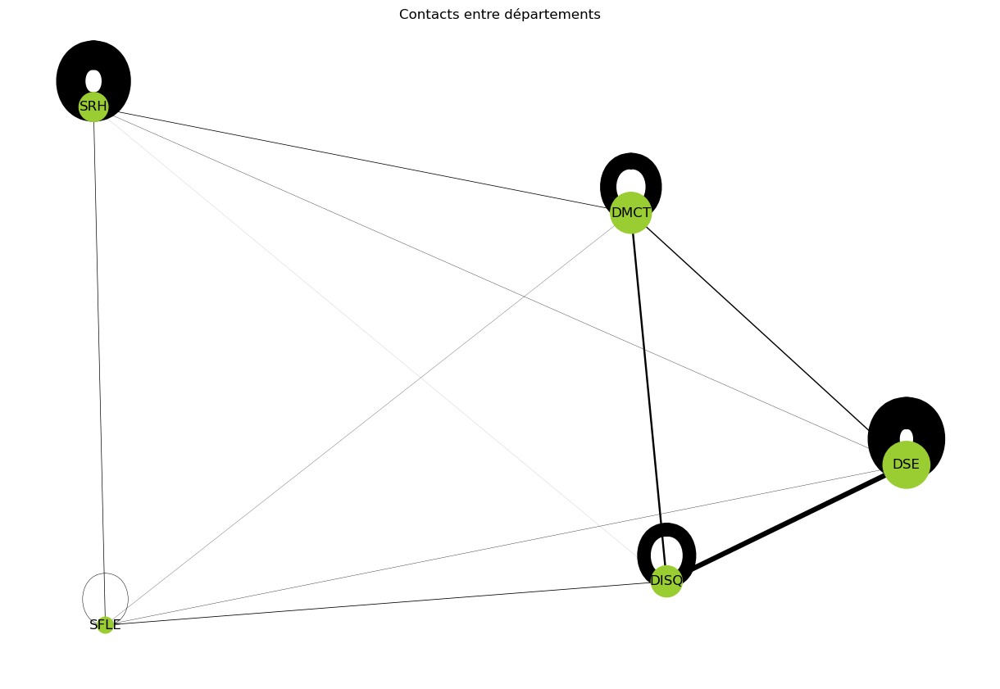

In [52]:
# Préparation des données pour le graphe
# Fusion des données de contacts avec les informations sur les départements
dept_contacts = pd.merge(contacts_dataframe, departments_dataframe, left_on='IDWorker1', right_on='IDWorker')
dept_contacts = pd.merge(dept_contacts, departments_dataframe, left_on='IDWorker2', right_on='IDWorker', suffixes=('_1', '_2'))

# Calcul du nombre de contacts entre chaque paire de départements
dept_contact_counts = dept_contacts.groupby(['Department_1', 'Department_2']).size().reset_index(name='ContactCount')

# Création du graphe
G_dept = nx.Graph()

# Ajout des nœuds (départements) avec la taille basée sur le nombre de personnes dans chaque département
dept_sizes = departments_dataframe['Department'].value_counts()
for dept, size in dept_sizes.items():
    G_dept.add_node(dept, size=size)

# Ajout des arêtes (contacts entre départements) avec l'épaisseur basée sur le nombre de contacts
for row in dept_contact_counts.itertuples():
    G_dept.add_edge(row.Department_1, row.Department_2, weight=row.ContactCount)

# Mise à l'échelle de la taille des nœuds et de l'épaisseur des arêtes pour la visualisation
node_sizes = [G_dept.nodes[node]['size'] * 50 for node in G_dept.nodes]  # Multiplier par un facteur pour la visibilité
edge_widths = [G_dept[u][v]['weight'] / 100 for u, v in G_dept.edges]  # Diviser par un facteur pour l'échelle

# Visualisation du graphe
plt.figure(figsize=(12, 8))
nx.draw(G_dept, with_labels=True, node_size=node_sizes, width=edge_widths, node_color='yellowgreen', edge_color='black')
plt.title("Contacts entre départements")
plt.show()

Distribution de degrés

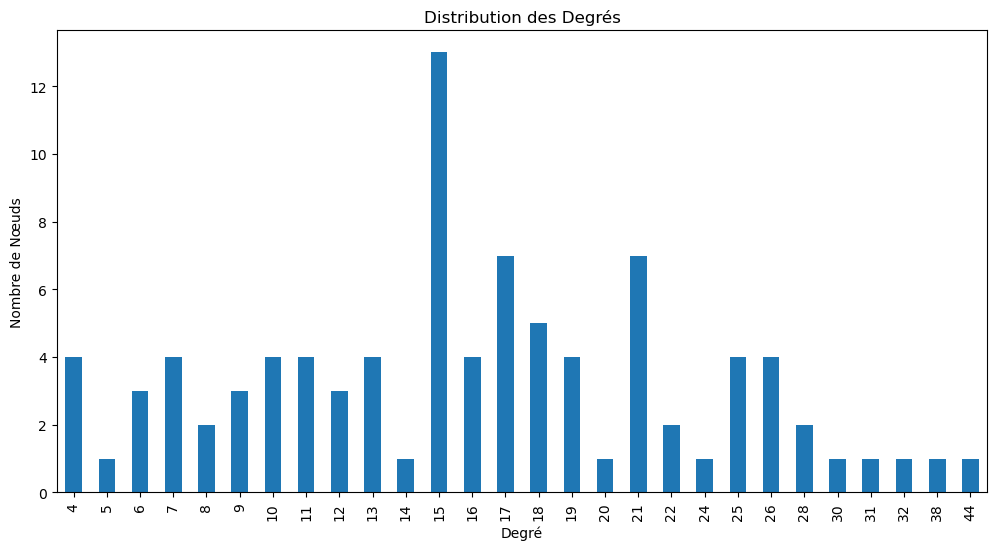

In [53]:
# Calculer les degrés de tous les nœuds
degrees = [degree for node, degree in G.degree()]

# Calculer la distribution de degrés
degree_counts = pd.Series(degrees).value_counts().sort_index()

# Visualiser la distribution de degrés
plt.figure(figsize=(12, 6))
degree_counts.plot(kind='bar')
plt.title('Distribution des Degrés')
plt.xlabel('Degré')
plt.ylabel('Nombre de Nœuds')
plt.show()

Graphe du degré de centralité

/var/folders/p0/2d1t9v591clds7w9d1k85tx80000gn/T/ipykernel_3452/3386885017.py:5: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = plt.cm.get_cmap('Blues')


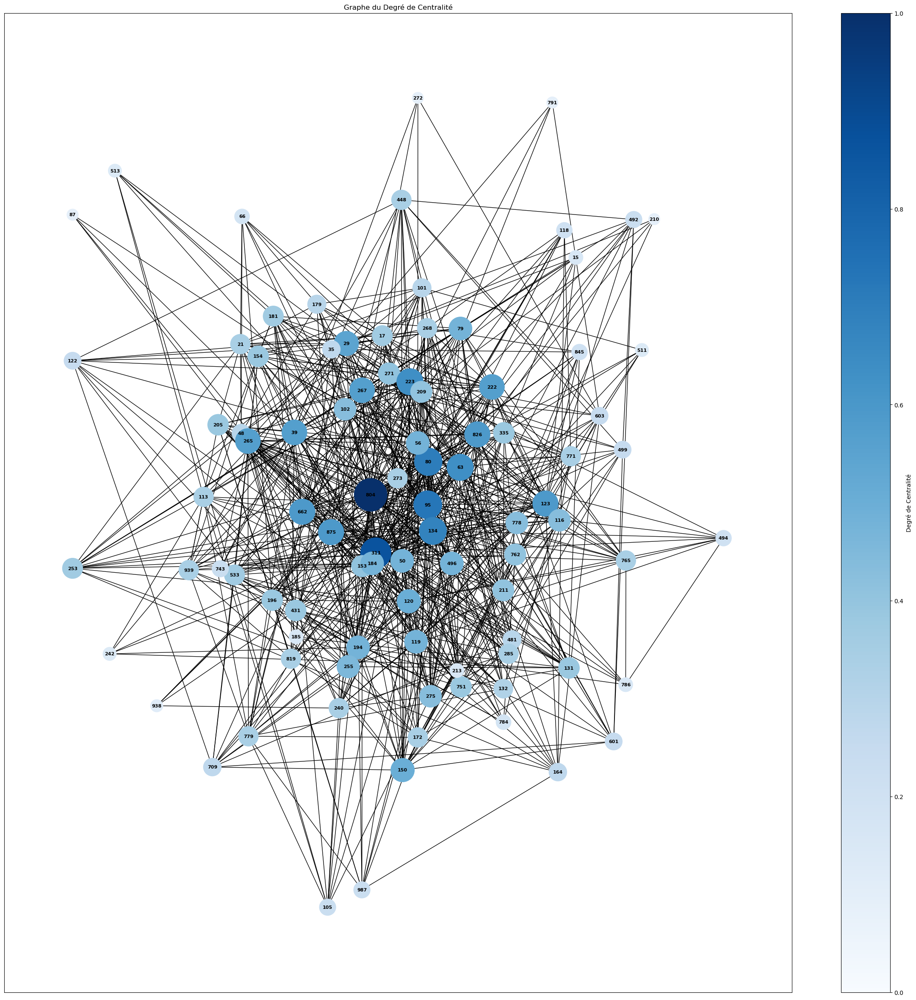

Nœud avec le plus haut degré de centralité : 804 (valeur : 0.4835164835164836)
Nœud avec le plus bas degré de centralité : 272 (valeur : 0.04395604395604396)


In [54]:
# Calcul du degré de centralité
degree_centrality = nx.degree_centrality(G)

# Utilisation de la colormap 'Blues' pour l'échelle de couleur bleue
cmap = plt.cm.get_cmap('Blues')
degree_values = list(degree_centrality.values())
max_degree_value = max(degree_values)
color_map = [cmap(value/max_degree_value) for value in degree_values]

# Ajustement de la taille des nœuds en fonction du degré de centralité
node_size = [value / max_degree_value * 3000 + 100 for value in degree_values]  # Ajustez selon vos besoins

# Dessin du graphe
plt.figure(figsize=(30, 30))
nx.draw_networkx_nodes(G, pos, node_color=color_map, node_size=node_size)
nx.draw_networkx_labels(G, pos, font_size=8, font_color='black', font_weight='bold')
nx.draw_networkx_edges(G, pos)
plt.title('Graphe du Degré de Centralité')
plt.colorbar(plt.cm.ScalarMappable(cmap=cmap), ax=plt.gca(), orientation='vertical', label='Degré de Centralité')
plt.show()

# Trouver le nœud avec le plus haut degré de centralité
max_degree_centrality_node = max(degree_centrality, key=degree_centrality.get)
max_degree_centrality_value = degree_centrality[max_degree_centrality_node]

# Trouver le nœud avec le plus bas degré de centralité
min_degree_centrality_node = min(degree_centrality, key=degree_centrality.get)
min_degree_centrality_value = degree_centrality[min_degree_centrality_node]

# Affichage
print(f"Nœud avec le plus haut degré de centralité : {max_degree_centrality_node} (valeur : {max_degree_centrality_value})")
print(f"Nœud avec le plus bas degré de centralité : {min_degree_centrality_node} (valeur : {min_degree_centrality_value})")

Graphe de la centralité de proximité

/var/folders/p0/2d1t9v591clds7w9d1k85tx80000gn/T/ipykernel_3452/2166099224.py:5: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = plt.cm.get_cmap('Reds')


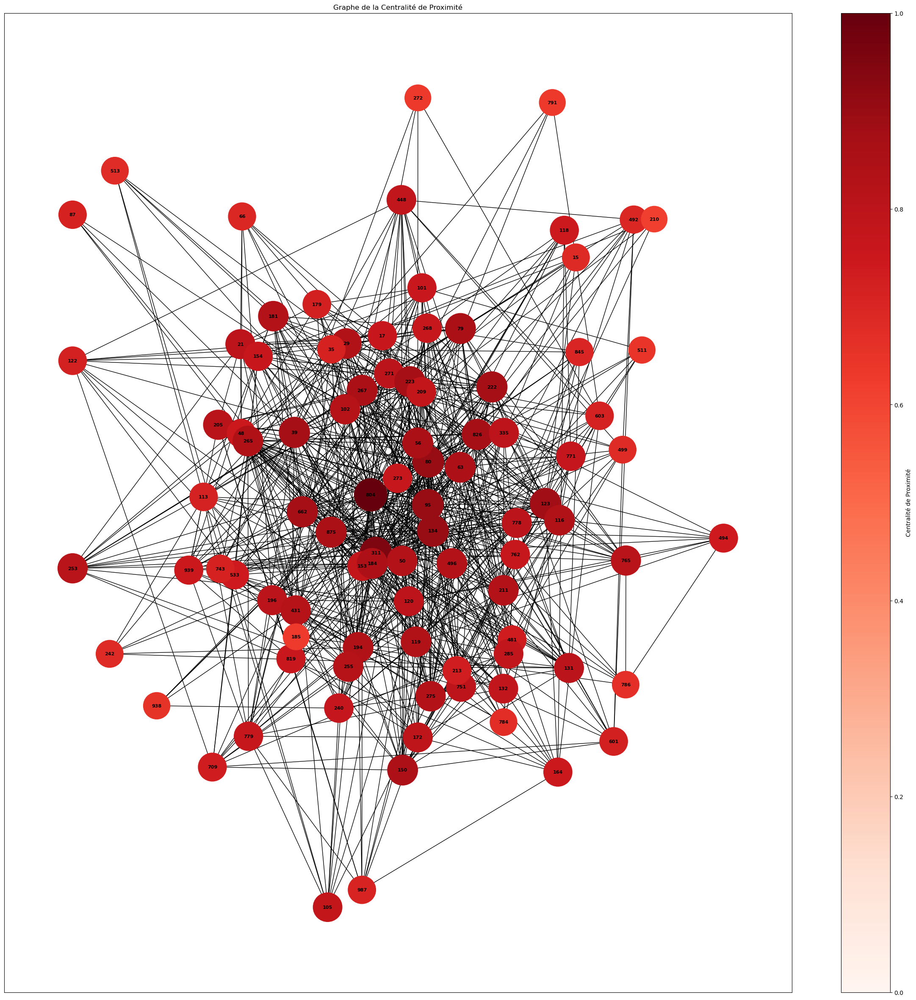

Nœud avec la plus haute centralité de proximité : 804 (valeur : 0.6594202898550725)
Nœud avec la plus basse centralité de proximité : 210 (valeur : 0.40625)


In [55]:
# Calcul de la centralité de proximité
closeness_centrality = nx.closeness_centrality(G)

# Utilisation de la colormap 'Reds' pour l'échelle de couleur rouge
cmap = plt.cm.get_cmap('Reds')
closeness_values = list(closeness_centrality.values())
max_closeness_value = max(closeness_values)
color_map = [cmap(value/max_closeness_value) for value in closeness_values]

# Ajustement de la taille des nœuds en fonction de la centralité de proximité
node_size = [value / max_closeness_value * 3000 + 100 for value in closeness_values]  # Ajustez selon vos besoins

# Dessin du graphe
plt.figure(figsize=(30, 30))
nx.draw_networkx_nodes(G, pos, node_color=color_map, node_size=node_size)
nx.draw_networkx_labels(G, pos, font_size=8, font_color='black', font_weight='bold')
nx.draw_networkx_edges(G, pos)
plt.title('Graphe de la Centralité de Proximité')
plt.colorbar(plt.cm.ScalarMappable(cmap=cmap), ax=plt.gca(), orientation='vertical', label='Centralité de Proximité')
plt.show()

# Trouver le nœud avec la plus haute centralité de proximité
max_closeness_centrality_node = max(closeness_centrality, key=closeness_centrality.get)
max_closeness_centrality_value = closeness_centrality[max_closeness_centrality_node]

# Trouver le nœud avec la plus basse centralité de proximité
min_closeness_centrality_node = min(closeness_centrality, key=closeness_centrality.get)
min_closeness_centrality_value = closeness_centrality[min_closeness_centrality_node]

# Affichage
print(f"Nœud avec la plus haute centralité de proximité : {max_closeness_centrality_node} (valeur : {max_closeness_centrality_value})")
print(f"Nœud avec la plus basse centralité de proximité : {min_closeness_centrality_node} (valeur : {min_closeness_centrality_value})")

Graphe de la centralité d'intermédiarité

/var/folders/p0/2d1t9v591clds7w9d1k85tx80000gn/T/ipykernel_3452/3168133719.py:5: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = plt.cm.get_cmap('Greens')


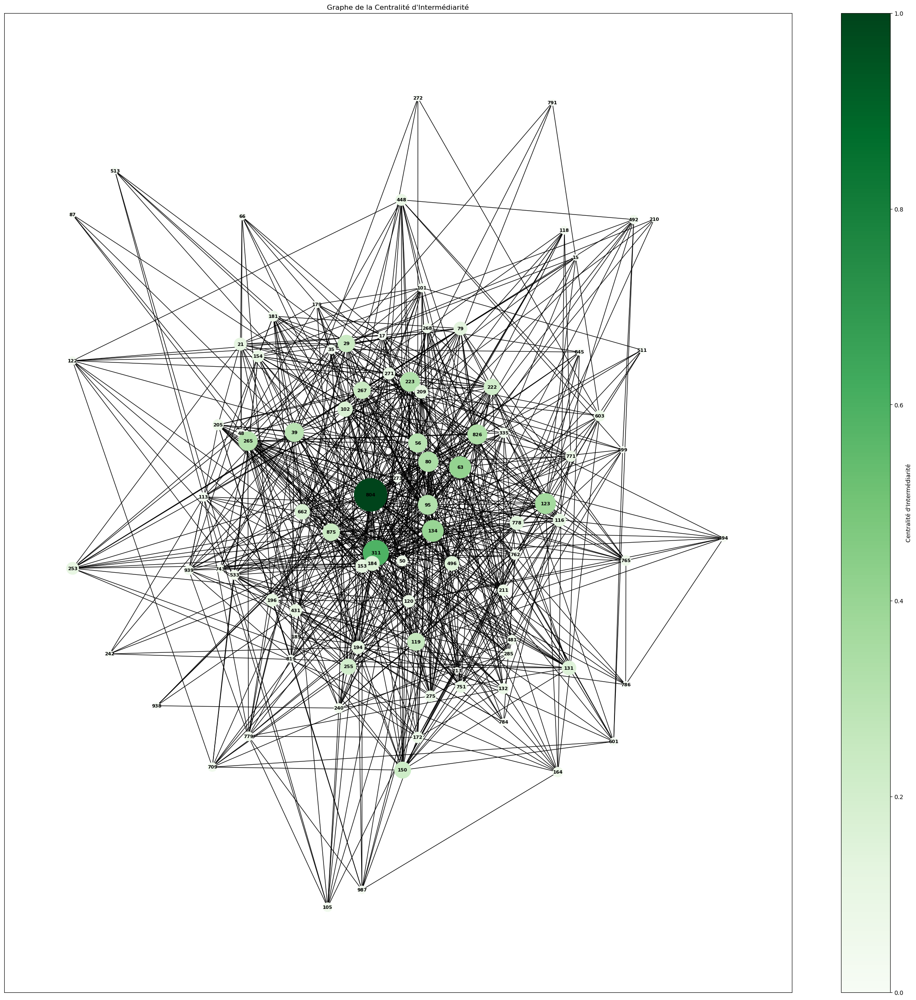

Nœud avec la plus haute centralité d'intermédiarité : 804 (valeur : 0.08899555608000675)
Nœud avec la plus basse centralité d'intermédiarité : 15 (valeur : 0.00018560975694733998)


In [56]:
# Calcul de la centralité d'intermédiarité
betweenness_centrality = nx.betweenness_centrality(G)

# Utilisation de la colormap 'Greens' pour l'échelle de couleur verte
cmap = plt.cm.get_cmap('Greens')
betweenness_values = list(betweenness_centrality.values())
max_betweenness_value = max(betweenness_values)
color_map = [cmap(value/max_betweenness_value) for value in betweenness_values]

# Ajustement de la taille des nœuds en fonction de la centralité d'intermédiarité
node_size = [value / max_betweenness_value * 3000 + 100 for value in betweenness_values]  # Ajustez selon vos besoins

# Dessin du graphe
plt.figure(figsize=(30, 30))
nx.draw_networkx_nodes(G, pos, node_color=color_map, node_size=node_size)
nx.draw_networkx_labels(G, pos, font_size=8, font_color='black', font_weight='bold')
nx.draw_networkx_edges(G, pos)
plt.title('Graphe de la Centralité d\'Intermédiarité')
plt.colorbar(plt.cm.ScalarMappable(cmap=cmap), ax=plt.gca(), orientation='vertical', label='Centralité d\'Intermédiarité')
plt.show()

# Trouver le nœud avec la plus haute centralité d'intermédiarité
max_betweenness_centrality_node = max(betweenness_centrality, key=betweenness_centrality.get)
max_betweenness_centrality_value = betweenness_centrality[max_betweenness_centrality_node]

# Trouver le nœud avec la plus basse centralité d'intermédiarité
min_betweenness_centrality_node = min(betweenness_centrality, key=betweenness_centrality.get)
min_betweenness_centrality_value = betweenness_centrality[min_betweenness_centrality_node]

# Affichage
print(f"Nœud avec la plus haute centralité d'intermédiarité : {max_betweenness_centrality_node} (valeur : {max_betweenness_centrality_value})")
print(f"Nœud avec la plus basse centralité d'intermédiarité : {min_betweenness_centrality_node} (valeur : {min_betweenness_centrality_value})")

Graphe de la centralité de vecteur propre

/var/folders/p0/2d1t9v591clds7w9d1k85tx80000gn/T/ipykernel_3452/1787592257.py:5: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = plt.cm.get_cmap('Oranges')


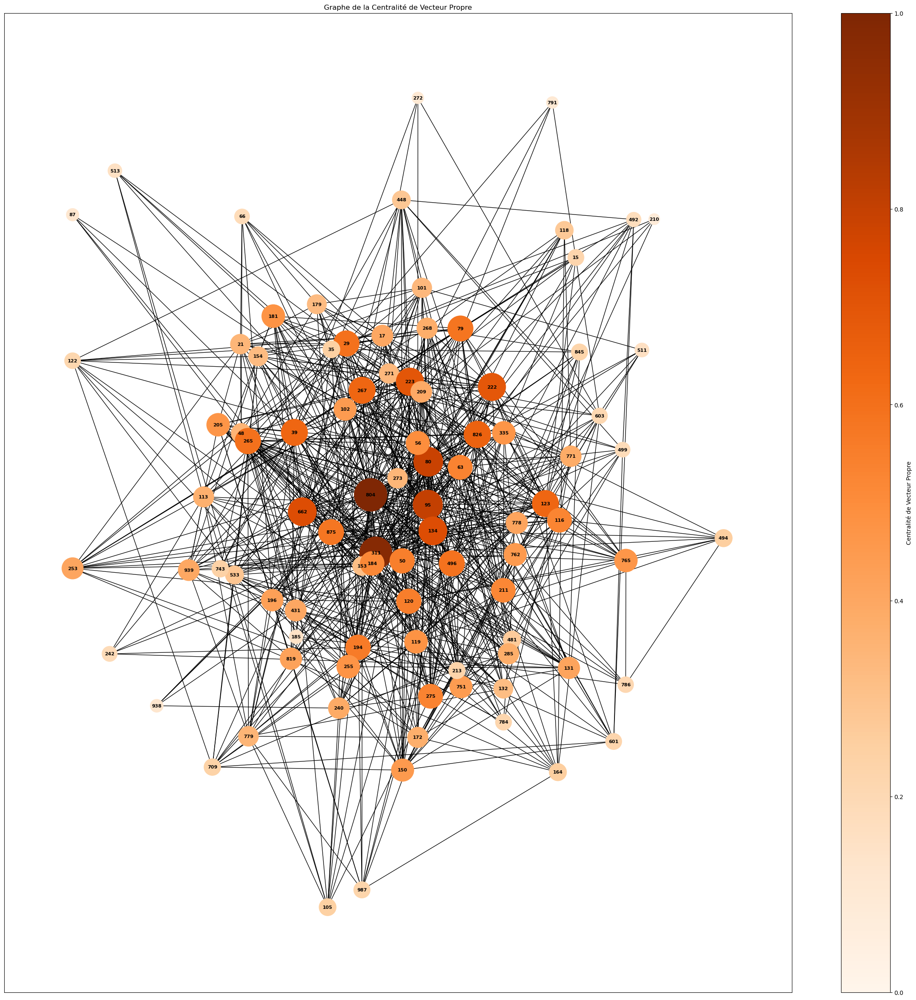

Nœud avec la plus haute centralité de vecteur propre : 804 (valeur : 0.23450617680054836)
Nœud avec la plus basse centralité de vecteur propre : 210 (valeur : 0.02010889838099489)


In [57]:
# Calcul de la centralité de vecteur propre
eigenvector_centrality = nx.eigenvector_centrality(G)

# Utilisation de la colormap 'Oranges' pour l'échelle de couleur orange
cmap = plt.cm.get_cmap('Oranges')
eigenvector_values = list(eigenvector_centrality.values())
max_eigenvector_value = max(eigenvector_values)
color_map = [cmap(value/max_eigenvector_value) for value in eigenvector_values]

# Ajustement de la taille des nœuds en fonction de la centralité de vecteur propre
node_size = [value / max_eigenvector_value * 3000 + 100 for value in eigenvector_values]  # Ajustez selon vos besoins

# Dessin du graphe
plt.figure(figsize=(30, 30))
nx.draw_networkx_nodes(G, pos, node_color=color_map, node_size=node_size)
nx.draw_networkx_labels(G, pos, font_size=8, font_color='black', font_weight='bold')
nx.draw_networkx_edges(G, pos)
plt.title('Graphe de la Centralité de Vecteur Propre')
plt.colorbar(plt.cm.ScalarMappable(cmap=cmap), ax=plt.gca(), orientation='vertical', label='Centralité de Vecteur Propre')
plt.show()

# Trouver le nœud avec la plus haute centralité de vecteur propre
max_eigenvector_centrality_node = max(eigenvector_centrality, key=eigenvector_centrality.get)
max_eigenvector_centrality_value = eigenvector_centrality[max_eigenvector_centrality_node]

# Trouver le nœud avec la plus basse centralité de vecteur propre
min_eigenvector_centrality_node = min(eigenvector_centrality, key=eigenvector_centrality.get)
min_eigenvector_centrality_value = eigenvector_centrality[min_eigenvector_centrality_node]

# Affichage
print(f"Nœud avec la plus haute centralité de vecteur propre : {max_eigenvector_centrality_node} (valeur : {max_eigenvector_centrality_value})")
print(f"Nœud avec la plus basse centralité de vecteur propre : {min_eigenvector_centrality_node} (valeur : {min_eigenvector_centrality_value})")

Graphe du coefficient de clustering

/var/folders/p0/2d1t9v591clds7w9d1k85tx80000gn/T/ipykernel_3452/681097214.py:5: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = plt.cm.get_cmap('Purples')


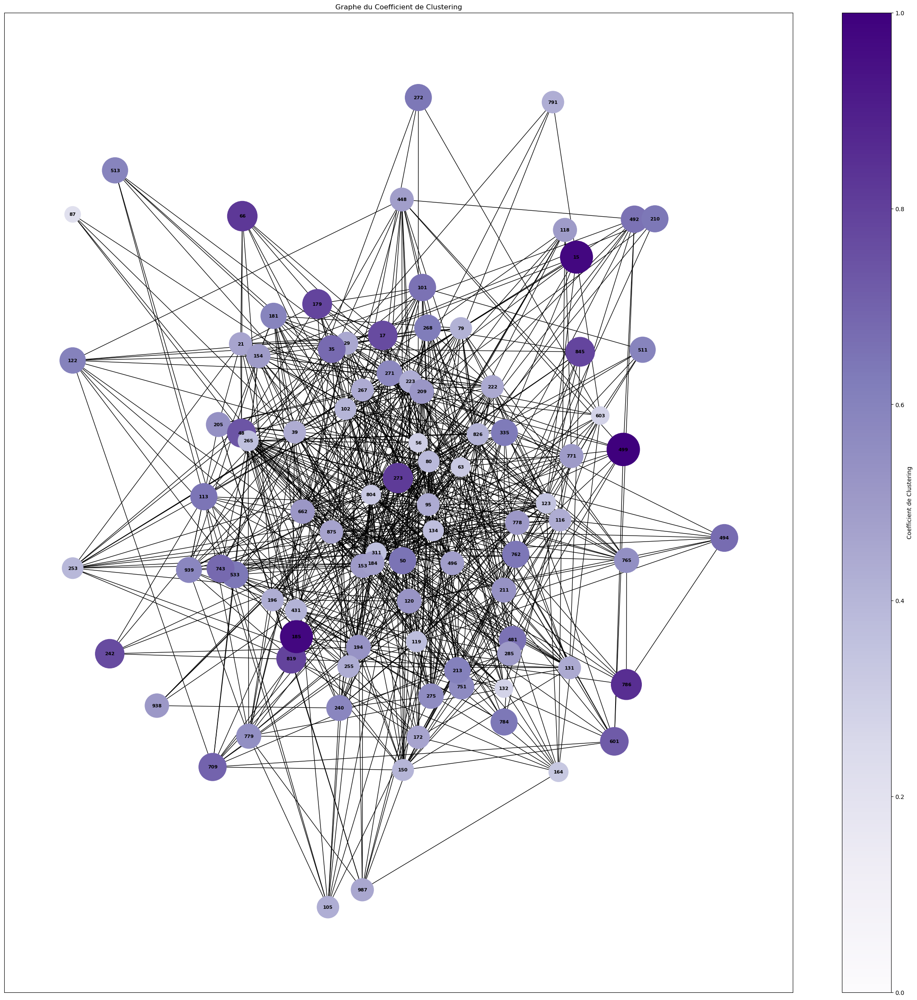

Moyenne du Coefficient de Clustering : 0.42603175376993013


In [58]:
# Calcul du coefficient de clustering pour chaque nœud
clustering_coefficient = nx.clustering(G)

# Utilisation de la colormap 'Purples' pour l'échelle de couleur mauve
cmap = plt.cm.get_cmap('Purples')
clustering_values = list(clustering_coefficient.values())
max_clustering_value = max(clustering_values)
color_map = [cmap(value/max_clustering_value) for value in clustering_values]

# Ajustement de la taille des nœuds en fonction du coefficient de clustering
node_size = [value / max_clustering_value * 3000 + 100 for value in clustering_values]  # Ajustez selon vos besoins

# Dessin du graphe
plt.figure(figsize=(30, 30))
nx.draw_networkx_nodes(G, pos, node_color=color_map, node_size=node_size)
nx.draw_networkx_labels(G, pos, font_size=8, font_color='black', font_weight='bold')
nx.draw_networkx_edges(G, pos)
plt.title('Graphe du Coefficient de Clustering')
plt.colorbar(plt.cm.ScalarMappable(cmap=cmap), ax=plt.gca(), orientation='vertical', label='Coefficient de Clustering')
plt.show()

# Calcul de ma moyenne du coefficient de clustering
average_clustering = nx.average_clustering(G)
print(f"Moyenne du Coefficient de Clustering : {average_clustering}")